In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torch.utils.tensorboard import SummaryWriter
from torchvision import transforms
from datasets import load_dataset
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
from PIL import Image
from collections import Counter
import os

In [3]:
dataset = load_dataset("beans")
print(dataset)
print(f"\nКлассы: {dataset['train'].features['labels'].names}")
print(f"Train: {len(dataset['train'])}")
print(f"Validation: {len(dataset['validation'])}")
print(f"Test: {len(dataset['test'])}")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md: 0.00B [00:00, ?B/s]

data/train-00000-of-00001.parquet:   0%|          | 0.00/144M [00:00<?, ?B/s]

data/validation-00000-of-00001.parquet:   0%|          | 0.00/18.5M [00:00<?, ?B/s]

data/test-00000-of-00001.parquet:   0%|          | 0.00/17.7M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/1034 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/133 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/128 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['image_file_path', 'image', 'labels'],
        num_rows: 1034
    })
    validation: Dataset({
        features: ['image_file_path', 'image', 'labels'],
        num_rows: 133
    })
    test: Dataset({
        features: ['image_file_path', 'image', 'labels'],
        num_rows: 128
    })
})

Классы: ['angular_leaf_spot', 'bean_rust', 'healthy']
Train: 1034
Validation: 133
Test: 128


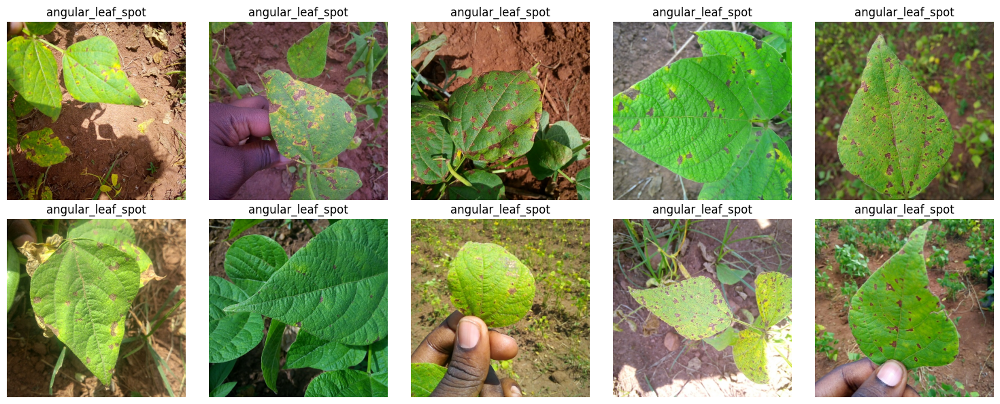

In [4]:
class_names = dataset['train'].features['labels'].names

fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for i, ax in enumerate(axes.flat):
    sample = dataset['train'][i]
    ax.imshow(sample['image'])
    ax.set_title(class_names[sample['labels']])
    ax.axis('off')
plt.tight_layout()
plt.show()

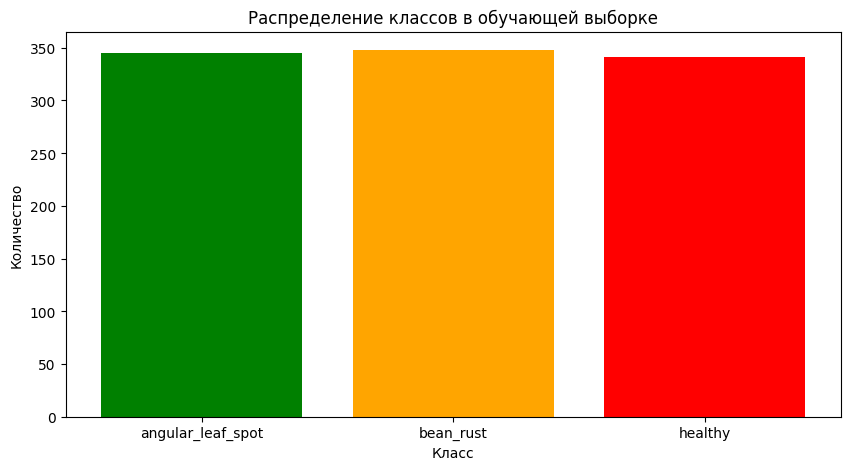

In [5]:
train_labels = [sample['labels'] for sample in dataset['train']]
label_counts = Counter(train_labels)

plt.figure(figsize=(10, 5))
plt.bar([class_names[i] for i in label_counts.keys()], label_counts.values(), color=['green', 'orange', 'red'])
plt.xlabel('Класс')
plt.ylabel('Количество')
plt.title('Распределение классов в обучающей выборке')
plt.show()

In [6]:
class BeansDataset(Dataset):
    def __init__(self, hf_dataset, transform=None):
        self.dataset = hf_dataset
        self.transform = transform

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        sample = self.dataset[idx]
        image = sample['image'].convert('RGB')
        label = sample['labels']

        if self.transform:
            image = self.transform(image)

        return image, label

In [7]:
train_transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [8]:
train_dataset = BeansDataset(dataset['train'], transform=train_transform)
val_dataset = BeansDataset(dataset['validation'], transform=test_transform)
test_dataset = BeansDataset(dataset['test'], transform=test_transform)

batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

print(f"Train batches: {len(train_loader)}")
print(f"Val batches: {len(val_loader)}")
print(f"Test batches: {len(test_loader)}")

Train batches: 33
Val batches: 5
Test batches: 4


In [9]:
class BeansCNN(nn.Module):
    def __init__(self, num_classes=3):
        super(BeansCNN, self).__init__()

        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),
        )

        self.classifier = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(256 * 8 * 8, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

In [10]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")

model = BeansCNN(num_classes=3).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=3, factor=0.5)

print(model)
total_params = sum(p.numel() for p in model.parameters())
print(f"\nTotal parameters: {total_params:,}")

Device: cuda
BeansCNN(
  (features): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running

In [11]:
writer = SummaryWriter('runs/beans_experiment')

dummy_input = torch.randn(1, 3, 128, 128).to(device)
writer.add_graph(model, dummy_input)

In [12]:
def train_epoch(model, loader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

    return running_loss / len(loader), 100. * correct / total


def validate(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item()
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()

    return running_loss / len(loader), 100. * correct / total

In [13]:
num_epochs = 30
best_val_acc = 0.0
history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

for epoch in range(num_epochs):
    train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, device)
    val_loss, val_acc = validate(model, val_loader, criterion, device)

    scheduler.step(val_loss)

    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)

    writer.add_scalars('Loss', {'train': train_loss, 'val': val_loss}, epoch)
    writer.add_scalars('Accuracy', {'train': train_acc, 'val': val_acc}, epoch)
    writer.add_scalar('Learning Rate', optimizer.param_groups[0]['lr'], epoch)

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), 'best_model.pth')
        print(f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%, Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}% [BEST]")
    else:
        print(f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%, Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%")

writer.close()
print(f"\nBest Validation Accuracy: {best_val_acc:.2f}%")

Epoch 1/30 - Train Loss: 2.5752, Train Acc: 50.39%, Val Loss: 0.7719, Val Acc: 69.17% [BEST]
Epoch 2/30 - Train Loss: 0.8161, Train Acc: 63.44%, Val Loss: 0.6965, Val Acc: 68.42%
Epoch 3/30 - Train Loss: 0.7085, Train Acc: 69.83%, Val Loss: 0.7641, Val Acc: 59.40%
Epoch 4/30 - Train Loss: 0.6955, Train Acc: 69.05%, Val Loss: 0.5516, Val Acc: 71.43% [BEST]
Epoch 5/30 - Train Loss: 0.6315, Train Acc: 73.79%, Val Loss: 0.5328, Val Acc: 72.93% [BEST]
Epoch 6/30 - Train Loss: 0.6169, Train Acc: 72.34%, Val Loss: 0.4425, Val Acc: 78.95% [BEST]
Epoch 7/30 - Train Loss: 0.5858, Train Acc: 74.66%, Val Loss: 0.4810, Val Acc: 72.93%
Epoch 8/30 - Train Loss: 0.5999, Train Acc: 73.31%, Val Loss: 0.4600, Val Acc: 81.95% [BEST]
Epoch 9/30 - Train Loss: 0.5070, Train Acc: 78.53%, Val Loss: 0.7488, Val Acc: 69.17%
Epoch 10/30 - Train Loss: 0.5339, Train Acc: 78.05%, Val Loss: 0.5120, Val Acc: 75.94%
Epoch 11/30 - Train Loss: 0.4649, Train Acc: 81.14%, Val Loss: 0.3085, Val Acc: 83.46% [BEST]
Epoch 12/3

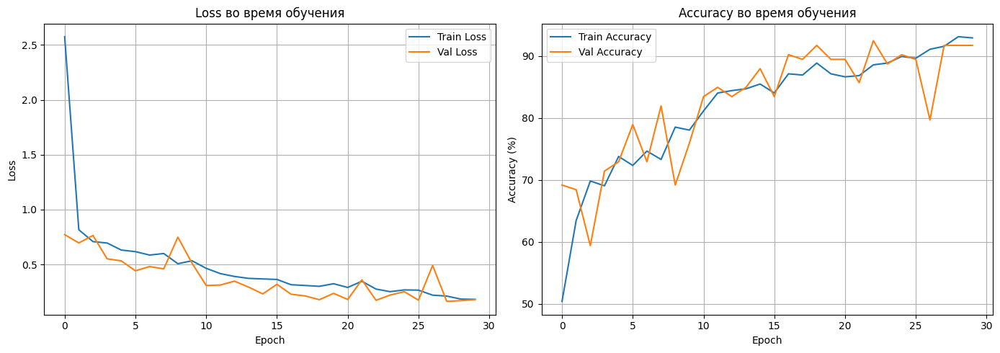

In [14]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(history['train_loss'], label='Train Loss')
axes[0].plot(history['val_loss'], label='Val Loss')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title('Loss во время обучения')
axes[0].legend()
axes[0].grid(True)

axes[1].plot(history['train_acc'], label='Train Accuracy')
axes[1].plot(history['val_acc'], label='Val Accuracy')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy (%)')
axes[1].set_title('Accuracy во время обучения')
axes[1].legend()
axes[1].grid(True)

plt.tight_layout()
plt.savefig('training_curves.png', dpi=150)
plt.show()

In [26]:
model.load_state_dict(torch.load('best_model.pth'))
model.eval()

BeansCNN(
  (features): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


In [16]:
def get_predictions(model, loader, device):
    model.eval()
    all_preds = []
    all_labels = []
    all_probs = []
    all_images = []

    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)
            _, preds = outputs.max(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
            all_images.extend(images.cpu())

    return np.array(all_preds), np.array(all_labels), np.array(all_probs), all_images

test_preds, test_labels, test_probs, test_images = get_predictions(model, test_loader, device)
train_preds, train_labels, train_probs, train_images = get_predictions(model, train_loader, device)

In [18]:
print("Test Set Results")
print(classification_report(test_labels, test_preds, target_names=class_names))

test_acc = 100. * np.mean(test_preds == test_labels)
print(f"Test Accuracy: {test_acc:.2f}%")

Test Set Results
                   precision    recall  f1-score   support

angular_leaf_spot       0.95      0.91      0.93        43
        bean_rust       0.86      0.86      0.86        43
          healthy       0.89      0.93      0.91        42

         accuracy                           0.90       128
        macro avg       0.90      0.90      0.90       128
     weighted avg       0.90      0.90      0.90       128

Test Accuracy: 89.84%


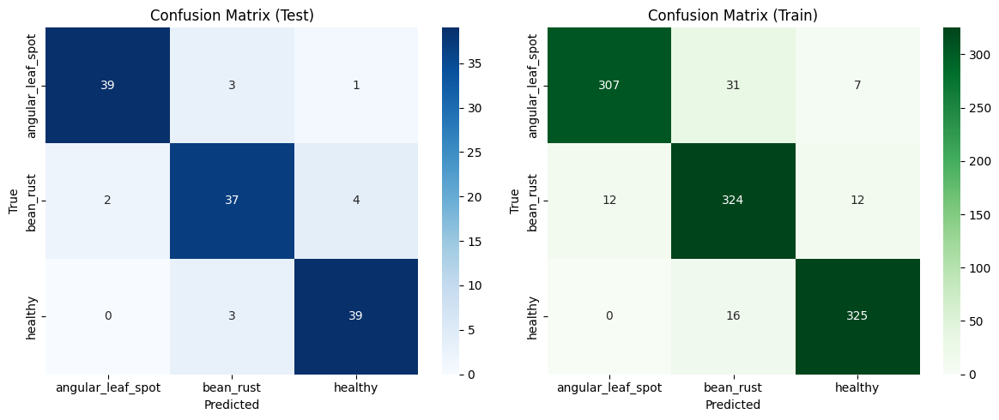

In [21]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

cm_test = confusion_matrix(test_labels, test_preds)
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names, ax=axes[0])
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('True')
axes[0].set_title('Confusion Matrix (Test)')

cm_train = confusion_matrix(train_labels, train_preds)
sns.heatmap(cm_train, annot=True, fmt='d', cmap='Greens', xticklabels=class_names, yticklabels=class_names, ax=axes[1])
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('True')
axes[1].set_title('Confusion Matrix (Train)')

plt.tight_layout()
plt.show()

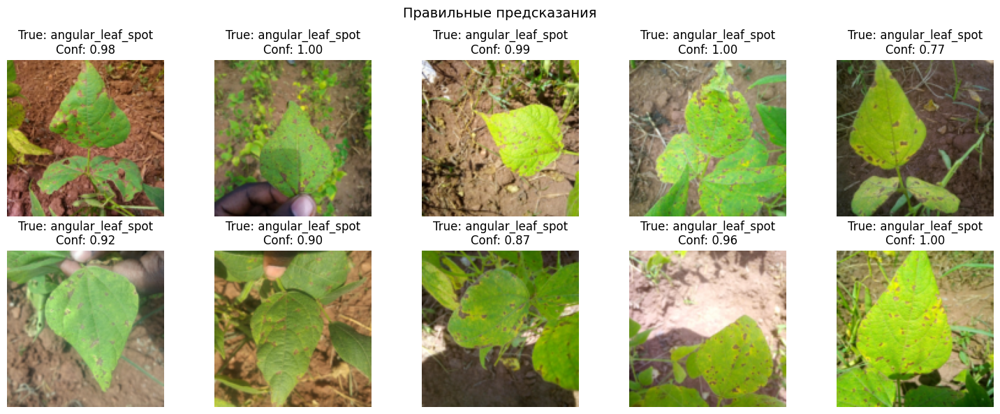

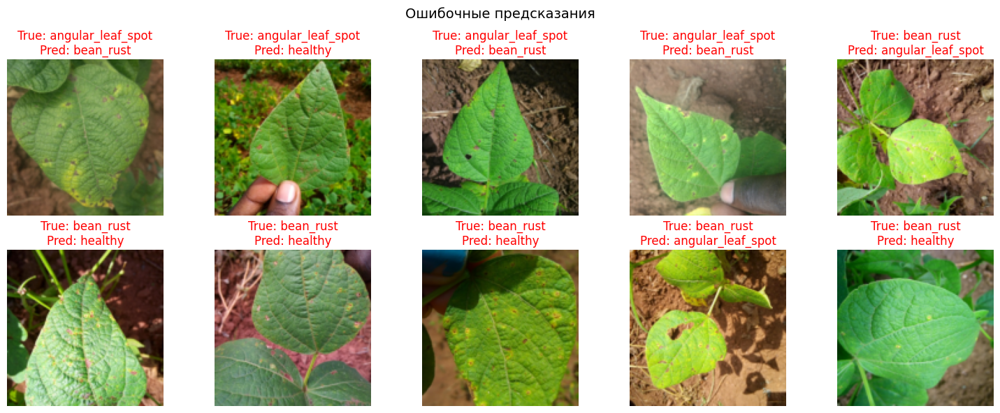

In [22]:
def denormalize(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    tensor = tensor * std + mean
    return torch.clamp(tensor, 0, 1).permute(1, 2, 0).numpy()

correct_indices = np.where(test_preds == test_labels)[0]
wrong_indices = np.where(test_preds != test_labels)[0]

fig, axes = plt.subplots(2, 5, figsize=(15, 6))
fig.suptitle('Правильные предсказания', fontsize=14)
for i, ax in enumerate(axes.flat):
    if i < len(correct_indices):
        idx = correct_indices[i]
        ax.imshow(denormalize(test_images[idx]))
        ax.set_title(f"True: {class_names[test_labels[idx]]}\nConf: {test_probs[idx].max():.2f}")
    ax.axis('off')
plt.tight_layout()
plt.show()

if len(wrong_indices) > 0:
    fig, axes = plt.subplots(2, 5, figsize=(15, 6))
    fig.suptitle('Ошибочные предсказания', fontsize=14)
    for i, ax in enumerate(axes.flat):
        if i < len(wrong_indices):
            idx = wrong_indices[i]
            ax.imshow(denormalize(test_images[idx]))
            ax.set_title(f"True: {class_names[test_labels[idx]]}\nPred: {class_names[test_preds[idx]]}", color='red')
        ax.axis('off')
    plt.tight_layout()
    plt.show()

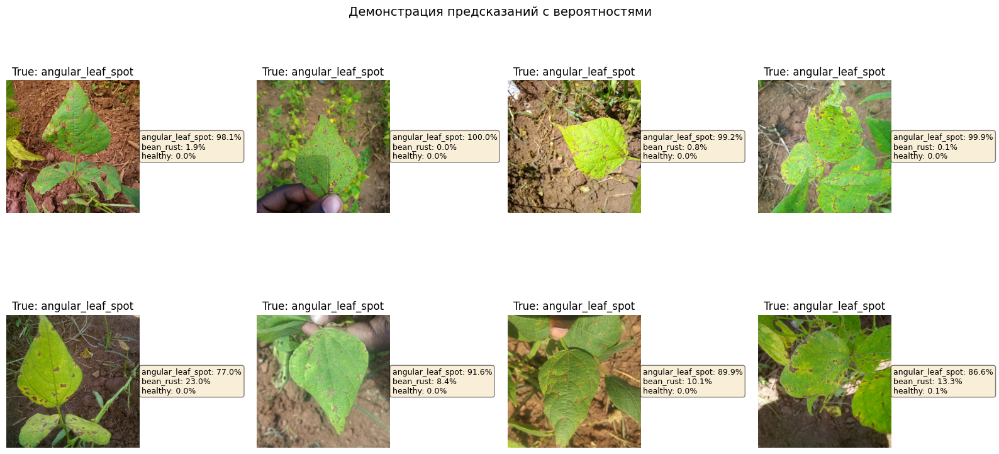

In [27]:
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
fig.suptitle('Демонстрация предсказаний с вероятностями', fontsize=14)

for i, ax in enumerate(axes.flat):
    sample = dataset['test'][i]
    img = sample['image'].convert('RGB')
    true_label = sample['labels']

    img_tensor = test_transform(img).unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(img_tensor)
        probs = torch.softmax(output, dim=1)[0].cpu().numpy()

    ax.imshow(img)
    ax.set_title(f"True: {class_names[true_label]}")
    ax.axis('off')

    prob_text = '\n'.join([f"{class_names[j]}: {probs[j]*100:.1f}%" for j in range(len(class_names))])
    ax.text(1.02, 0.5, prob_text, transform=ax.transAxes, fontsize=9, verticalalignment='center',
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.tight_layout()
plt.show()

In [25]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

# Выводы

**Какие проблемы были решены:**
- Image classification на датасете Beans

**Какие метрики достигнуты:**
- Test Accuracy: 89.84%

**Какие улучшения могли бы быть добавлены:**
- Взять мощный image backbone, например DINOv2, и обучать только последние несколько слоёв